# HW1 - Decision Tree model to predict consumer churn

### Data Input and Preliminary analysis

In [134]:
# To write a Python 2/3 compatible codebase, below line is added
from __future__ import division, print_function, unicode_literals
np.random.seed(42)

# Numpy is the fundamental package for scientific computing with Python. 
# Os module provides a portable way of using operating system dependent functionality.
# Using pandas for reading csvs and data wrangling
import numpy as np # np is an alias pointing to numpy
import pandas as pd # pd is an alias pointing to pandas
import os  # setting paths etc

df = pd.read_csv("HW1_Data.csv",sep=',') # reading data from current directory
df.head()  # understanding the data by previewing a sample
print(df.shape) # no of rows and columns in data
print(df.nunique()) # no of unique values in each column
print(df.isnull().any()) # to chech if any column has missing values
print(df.head()) # Looking at the first 5 rows of the data
print(df.describe(include='all')) # simple statistics on each column in data
# There are negative vales in revenue and eqpdays columns. Thus these rows are filtered out below
df1 = df[df['revenue']>=0]
df2 = df1[df1['eqpdays']>=0]

(31891, 12)
revenue     10563
outcalls      706
incalls       412
months         55
eqpdays      1354
webcap          2
marryyes        2
travel          2
pcown           2
creditcd        2
retcalls        5
churndep        2
dtype: int64
revenue     False
outcalls    False
incalls     False
months      False
eqpdays     False
webcap      False
marryyes    False
travel      False
pcown       False
creditcd    False
retcalls    False
churndep    False
dtype: bool
   revenue  outcalls  incalls  months  eqpdays  webcap  marryyes  travel  \
0    83.53     20.00      1.0      31      745       1         0       0   
1    29.99      0.00      0.0      52     1441       0         0       0   
2    37.75      2.67      0.0      25      572       0         0       0   
3     5.25      0.00      0.0      45     1354       0         0       0   
4    42.71      8.67      0.0      27      224       1         0       0   

   pcown  creditcd  retcalls  churndep  
0      0         0         4     

### Exploratory data analysis & Visualization

##### Histograms

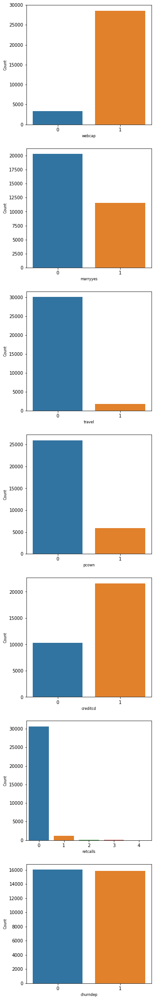

In [135]:
import matplotlib.pyplot as plt
#pyplot is matplotlib's plotting framework

col_names = ['webcap','marryyes','travel','pcown','creditcd','retcalls','churndep']

#passing column names in the data as a list to variable col_names, which will be useful in below plots
fig, ax = plt.subplots(len(col_names), figsize=(5,40))
for i, col_val in enumerate(col_names):

    sns.countplot(df[col_val], ax=ax[i])
    #ax[i].set_title('Freq dist '+col_val, fontsize=8)
    ax[i].set_xlabel(col_val, fontsize=8)
    ax[i].set_ylabel('Count', fontsize=8)

plt.show()

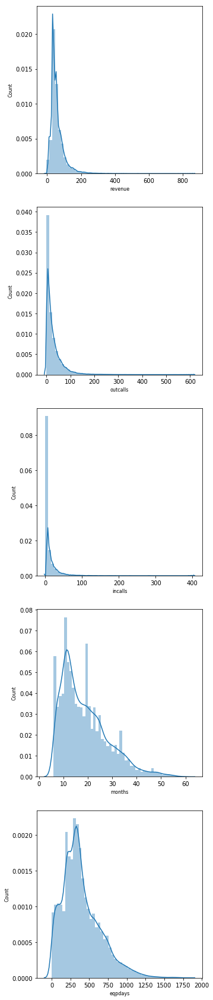

In [136]:
col_names2 = ['revenue','outcalls','incalls','months','eqpdays']

#passing column names in the data as a list to variable col_names, which will be useful in below plots
fig, ax = plt.subplots(len(col_names2), figsize=(5,30))
for i, col_val in enumerate(col_names2):

    sns.distplot(df[col_val], ax=ax[i])
    #ax[i].set_title('Freq dist '+col_val, fontsize=8)
    ax[i].set_xlabel(col_val, fontsize=8)
    ax[i].set_ylabel('Count', fontsize=8)

plt.show()

##### Correlation Heat map 

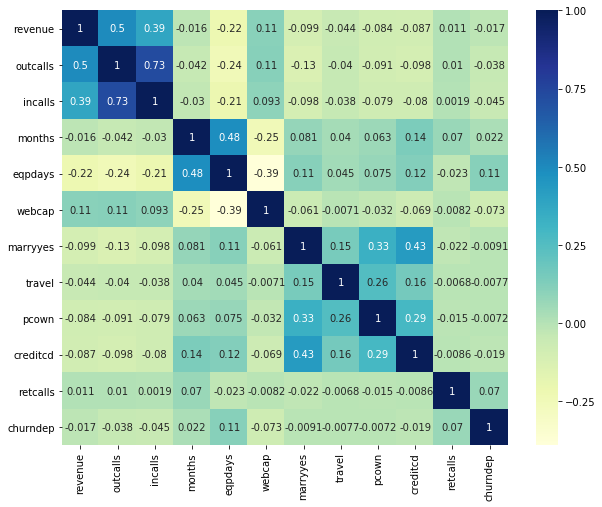

In [137]:
f, ax = plt.subplots(figsize=(10, 8))
# creating correlation matrix
corr = df.corr()

# Seaborn is a Python data visualization library based on matplotlib. 
import seaborn as sns
#using a heatmap to visualize the correlation matrix
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, cmap="YlGnBu",annot=True)

### Decision Tree model Induction

In [146]:
#split dataset in features and target variable
X = df2.iloc[:,:-1]# Features
y = df2["churndep"] # Target variable
feature_cols = list(X.columns)

import scipy as sp # sp is an alias pointing to scipy
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier()
#Predict the response for test dataset
y_pred = clf.fit(X_train,y_train).predict(X_test)

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

clf_A = accuracy_score(y_test,y_pred)
clf_P = precision_score(y_test,y_pred)
clf_R = recall_score(y_test,y_pred)
clf_F = f1_score(y_test,y_pred)
clf_Pn = precision_score(y_test,y_pred,pos_label=0)
clf_Rn = recall_score(y_test,y_pred,pos_label=0)
clf_Fn = f1_score(y_test,y_pred,pos_label=0)

print("The accuracy score of clf model is " + str(clf_A))    
print("The churn precision score of clf model is " + str(clf_P))
print("The churn recall score of clf model is " + str(clf_R))
print("The churn F measure of clf model is " + str(clf_F))
print("The no churn precision score of clf model is " + str(clf_Pn))
print("The no churn recall score of clf model is " + str(clf_Rn))
print("The no churn F measure of clf model is " + str(clf_Fn))

clf2 = DecisionTreeClassifier(criterion="entropy")
y_pred2 = clf.fit(X_train,y_train).predict(X_test)

clf2_A = accuracy_score(y_test,y_pred2)
clf2_P = precision_score(y_test,y_pred2)
clf2_R = recall_score(y_test,y_pred2)
clf2_F = f1_score(y_test,y_pred2)

print("The accuracy score of clf2 model is " + str(clf2_A))
print("The churn precision score of clf2 model is " + str(clf2_P))
print("The churn recall score of clf2 model is " + str(clf2_R))
print("The churn F measure of clf2 model is " + str(clf2_F))

The accuracy score of clf model is 0.5295164329076827
The churn precision score of clf model is 0.5217023078551768
The churn recall score of clf model is 0.5242553191489362
The churn F measure of clf model is 0.522975697760798
The no churn precision score of clf model is 0.5371558683502381
The no churn recall score of clf model is 0.534610630407911
The no churn F measure of clf model is 0.5358802271553949
The accuracy score of clf2 model is 0.5248063638266695
The churn precision score of clf2 model is 0.5171379605826907
The churn recall score of clf2 model is 0.5136170212765957
The churn F measure of clf2 model is 0.5153714773697694


### Visualizing the decision tree

In [4]:
from sklearn.tree import export_graphviz  
from sklearn import tree
import graphviz 

dtreeexp = tree.export_graphviz(clf, out_file=None,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
treegraph = graphviz.Source(dtreeexp) 
treegraph

### Model Evaluation

Confusion matrix, without normalization
[[2595 2259]
 [2236 2464]]
Normalized confusion matrix
[[0.53 0.47]
 [0.48 0.52]]


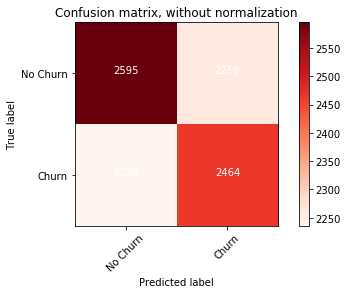

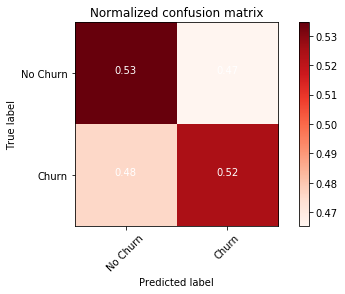

In [147]:
###################################### Confusion Matrix #####################################
from sklearn.metrics import confusion_matrix
import itertools
# Function that prints and plots the confusion matrix.
# Normalization can be applied by setting `normalize=True
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
# Compute confusion matrix to evaluate the accuracy of a classification    
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

#cnf_matrix = confusion_matrix(y_test, y_pred)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["No Churn","Churn"],
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["No Churn","Churn"], normalize=True,
                      title='Normalized confusion matrix')

plt.show()